# ΑΝΑΛΥΣΗ ΔΕΔΟΜΕΝΩΝ

In [ ]:
# gia dokimes gia na mporoume na meiwsoume to dataframe
import pandas as pd
import numpy as np

# svinoume thn parametro nrows gia na paroume to full dataset
df = pd.read_csv('train.csv', sep=",")
df.to_csv('smalltrain.csv')

df_test = pd.read_csv('test.csv', sep = ',')
df_test.to_csv('smalltest.csv')

df_target = pd.read_csv('target.csv', sep = ',')
df_target.to_csv('smalltarget.csv')


# 1) Αφαίρεση outliers

In [ ]:
#Read from csv
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import manhattan_distances
df = pd.read_csv('smalltrain.csv', sep="," )
df_test = pd.read_csv('smalltest.csv', sep="," )

mean_trip_duration=df.describe()[["trip_duration"]].loc["mean"][0]
std_trip_duration=df.describe()[["trip_duration"]].loc["std"][0]
# Remove outliers
df=df.drop(df[df['trip_duration']>(mean_trip_duration + 2*std_trip_duration)].index)
df=df.drop(df[df['trip_duration']<(mean_trip_duration - 2*std_trip_duration)].index)

# 2) Αφαίρεση σημείων εκτός NY

In [ ]:

# Remove trips outside city borders
df=df.drop(df[df['pickup_longitude']>(-73.75)].index)
df=df.drop(df[df['pickup_longitude']<(-74.03)].index)
df=df.drop(df[df['dropoff_longitude']>(-73.75)].index)
df=df.drop(df[df['dropoff_longitude']<(-74.03)].index)

df=df.drop(df[df['pickup_latitude']>(40.85)].index)
df=df.drop(df[df['pickup_latitude']<(40.63)].index)
df=df.drop(df[df['dropoff_latitude']>(40.85)].index)
df=df.drop(df[df['dropoff_latitude']<(40.63)].index)



# 3) Μορφοποίηση και στατιστικά για ημέρες/ώρες

In [ ]:
# Morfopoisi imerominion
df["dropoff_datetime"]=pd.to_datetime(df["dropoff_datetime"],infer_datetime_format=True)
df["dropoff_day_period"]=pd.DatetimeIndex(df["dropoff_datetime"]).hour 

df["dropoff_day_name"]=df["dropoff_datetime"].dt.day_name()
df["dropoff_month"]=pd.DatetimeIndex(df["dropoff_datetime"]).month
df["dropoff_hour"]=pd.DatetimeIndex(df["dropoff_datetime"]).hour
df["dropoff_year"]=pd.DatetimeIndex(df["dropoff_datetime"]).year
df["dropoff_season"]=pd.DatetimeIndex(df["dropoff_datetime"]).month 
# 1 = spring , 2 = summer ,3 = autumn , 4 = winter
df["dropoff_season"].replace({12:4,1:4,2:4,3:1,4:1,5:1,6:2,7:2,8:2,9:3,10:3,11:3},inplace=True) 

# dictionary pou tha kanoume map tis wres stis periodous ths hmeras
# Morning = 1 , Afternoon = 2 ,Evening = 3 , Late Night =4
vals_to_replace = {}
for i in range(24):
  if i in (0,1,2,3,4,5,22,23):
    vals_to_replace[i] = 4
  elif i in (6,7,8,9,10,11):
    vals_to_replace[i] = 1
  elif i in (12,13,14,15):
    vals_to_replace[i] = 2
  else:
    vals_to_replace[i] = 3


df["dropoff_day_period"] = df["dropoff_day_period"].map(vals_to_replace)

df["pickup_datetime"]=pd.to_datetime(df["pickup_datetime"],infer_datetime_format=True)
df["pickup_day_period"]=pd.DatetimeIndex(df["pickup_datetime"]).hour 

df["pickup_day_name"]=df["pickup_datetime"].dt.day_name()
df["pickup_month"]=pd.DatetimeIndex(df["pickup_datetime"]).month
df["pickup_hour"]=pd.DatetimeIndex(df["pickup_datetime"]).hour
df["pickup_year"]=pd.DatetimeIndex(df["pickup_datetime"]).year
df["pickup_season"]=pd.DatetimeIndex(df["pickup_datetime"]).month 
# 1 = spring , 2 = summer ,3 = autumn , 4 = winter
df["pickup_season"].replace({12:4,1:4,2:4,3:1,4:1,5:1,6:2,7:2,8:2,9:3,10:3,11:3},inplace=True)

df["pickup_day_period"] = df["pickup_day_period"].map(vals_to_replace)





<function matplotlib.pyplot.show>

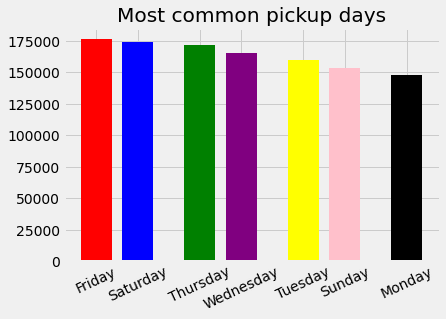

In [ ]:
# Most common pickup days
most_common_days=df.pickup_day_name.str.split(expand=True).stack().value_counts()
most_common_days_ticks=most_common_days.index.tolist()
left=[0,20,50,70,100,120,150]
height=most_common_days
tick_label=most_common_days_ticks
plt.bar(left,height,tick_label=tick_label,width=15,color=['red','blue','green','purple','yellow','pink','black'])
plt.xticks(rotation= 25)
plt.title('Most common pickup days')
plt.show

<function matplotlib.pyplot.show>

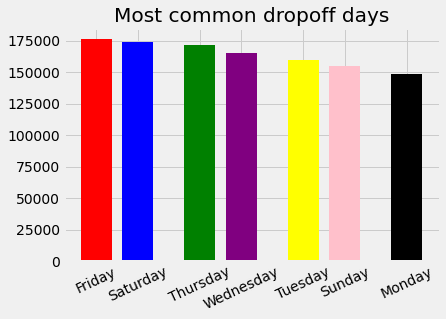

In [ ]:
# Most common dropoff days
most_common_days=df.dropoff_day_name.str.split(expand=True).stack().value_counts()
most_common_days_ticks=most_common_days.index.tolist()
left=[0,20,50,70,100,120,150]
height=most_common_days
tick_label=most_common_days_ticks
plt.bar(left,height,tick_label=tick_label,width=15,color=['red','blue','green','purple','yellow','pink','black'])
plt.xticks(rotation= 25)
plt.title('Most common dropoff days')
plt.show

<function matplotlib.pyplot.show>

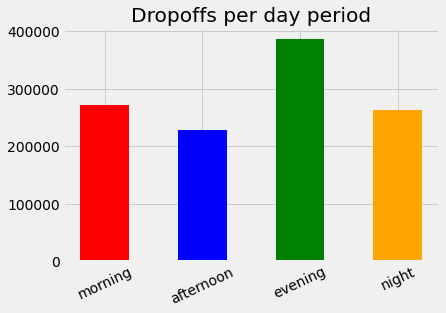

In [ ]:
# Trips per day period
#dropoff
morning=0
afternoon=0
evening=0
night=0
for time in df['dropoff_day_period']:
  if time== 1:
    morning=morning+1
  elif time== 2:
    afternoon= afternoon+1
  elif time== 3:
    evening= evening+1
  else:
    night= night + 1
left=[0,20,40,60]#max([morning,afternoon,evening,night])]
height=[morning,afternoon,evening,night]
tick_label=["morning",'afternoon','evening','night']
plt.bar(left,height,tick_label=tick_label,width=10,color=['red','blue','green','orange'])
plt.xticks(rotation= 25)
plt.title('Dropoffs per day period')
plt.show


<function matplotlib.pyplot.show>

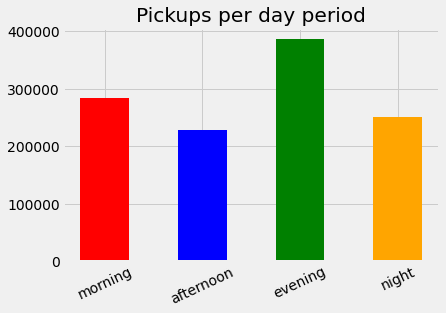

In [ ]:
# Trips per day period
#pickup
morning=0
afternoon=0
evening=0
night=0
for time in df['pickup_day_period']:
  if time == 1:
    morning = morning + 1
  elif time == 2:
    afternoon = afternoon + 1
  elif time == 3:
    evening = evening + 1
  else:
    night=night+1
left=[0,20,40,60]
height=[morning,afternoon,evening,night]
tick_label=["morning",'afternoon','evening','night']
plt.bar(left,height,tick_label=tick_label,width = 10,color=['red','blue','green','orange'])
plt.xticks(rotation= 25)
plt.title('Pickups per day period')
plt.show

<function matplotlib.pyplot.show>

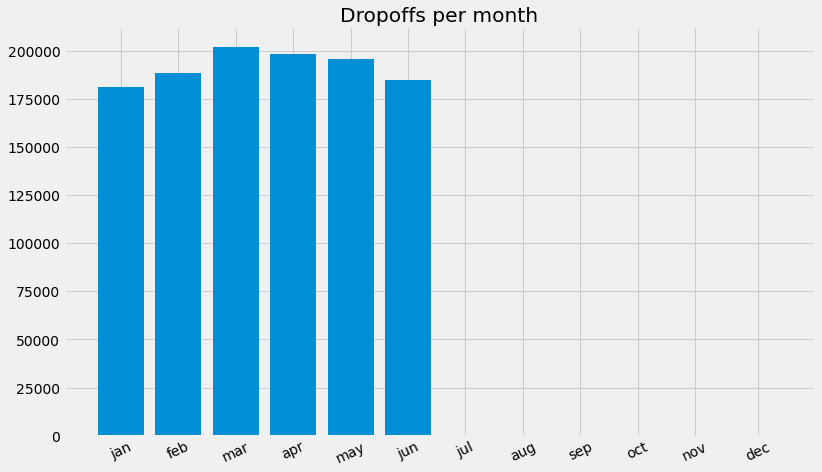

In [ ]:
#Trips per month
#dropoff
trips_per_month=[0,0,0,0,0,0,0,0,0,0,0,0]
for month in df["dropoff_month"]:
  trips_per_month[month-1]=trips_per_month[month-1]+1
left=[0,10,20,30,40,50,60,70,80,90,100,111]
height=trips_per_month
tick_label=['jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec']
fig = plt.figure(figsize =(12, 7))

plt.bar(left,height,tick_label=tick_label,width = 8)
plt.xticks(rotation= 25)
plt.title('Dropoffs per month')
plt.show


<function matplotlib.pyplot.show>

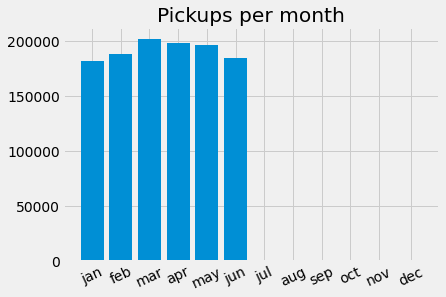

In [ ]:
#Trips per month
#pickup
trips_per_month=[0,0,0,0,0,0,0,0,0,0,0,0]
for month in df["pickup_month"]:
  trips_per_month[month-1]=trips_per_month[month-1]+1
left=[0,10,20,30,40,50,60,70,80,90,100,111]
height=trips_per_month
tick_label=['jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec']

plt.bar(left,height,tick_label=tick_label,width = 8)
plt.xticks(rotation= 25)
plt.title('Pickups per month')
plt.show

<function matplotlib.pyplot.show>

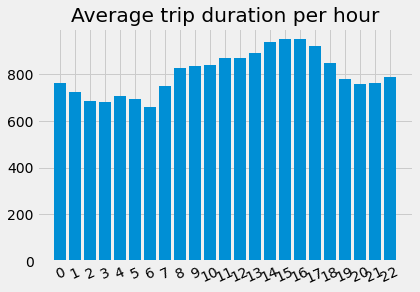

In [ ]:
# Average trip duration by pickup hour
trips_count=[0]*24
total_duration=[0]*24
for index in range(df.shape[0]):
  total_duration[df['pickup_hour'].iloc[index]]=total_duration[df['pickup_hour'].iloc[index]]+df["trip_duration"].iloc[index]
  trips_count[df['pickup_hour'].iloc[index]]=trips_count[df['pickup_hour'].iloc[index]]+1
ticks = list(range(0,23))
values=[]
for i in range(0,23):
  if(trips_count[i]>0):
    values.append(total_duration[i]/trips_count[i])
  else:
    values.append(0)
plt.bar(ticks,values)
plt.xticks(ticks,rotation= 25)
plt.title('Average trip duration per hour')
plt.show

<function matplotlib.pyplot.show>

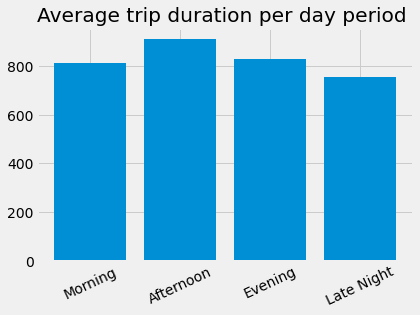

In [ ]:
# Average trip duration by day period
trips_count=[0]*4
total_duration=[0]*4

for index in range(df.shape[0]):
  trueIndex=0
  if df['pickup_day_period'].iloc[index]== 1 :
    trueIndex=0
  elif df['pickup_day_period'].iloc[index]== 2:
    trueIndex=1
  elif df['pickup_day_period'].iloc[index]== 3:
    trueIndex=2
  else:
    trueIndex=3
  total_duration[trueIndex]=total_duration[trueIndex]+df["trip_duration"].iloc[index]
  trips_count[trueIndex]=trips_count[trueIndex]+1

ticks = ["Morning","Afternoon",'Evening',"Late Night"]
values=[]
for i in range(0,4):
  if(trips_count[i]>0):
    values.append(total_duration[i]/trips_count[i])
  else:
    values.append(0)
plt.bar(ticks,values)
plt.xticks(ticks,rotation= 25)
plt.title('Average trip duration per day period ')
plt.show

<function matplotlib.pyplot.show>

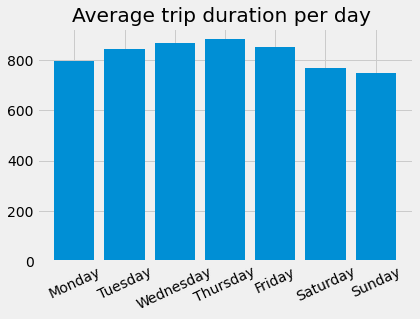

In [ ]:
# Average trip duration per day 
trips_count=[0]*7
total_duration=[0]*7

for index in range(df.shape[0]):
  trueIndex=0
  if df['pickup_day_name'].iloc[index]=='Monday':
    trueIndex=0
  elif df['pickup_day_name'].iloc[index]=='Tuesday':
    trueIndex=1
  elif df['pickup_day_name'].iloc[index]=='Wednesday':
    trueIndex=2
  elif df['pickup_day_name'].iloc[index]=='Thursday':
    trueIndex=3
  elif df['pickup_day_name'].iloc[index]=='Friday':
    trueIndex=4
  elif df['pickup_day_name'].iloc[index]=='Saturday':
    trueIndex=5
  elif df['pickup_day_name'].iloc[index]=='Sunday':
    trueIndex=6
  total_duration[trueIndex]=total_duration[trueIndex]+df["trip_duration"].iloc[index]
  trips_count[trueIndex]=trips_count[trueIndex]+1

ticks = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
values=[]
for i in range(0,7):
  if(trips_count[i]>0):
    values.append(total_duration[i]/trips_count[i])
  else:
    values.append(0)
plt.bar(ticks,values)
plt.xticks(ticks,rotation= 25)
plt.title('Average trip duration per day ')
plt.show

# 5) Μέσος χρόνος ανα οδηγό

<function matplotlib.pyplot.show>

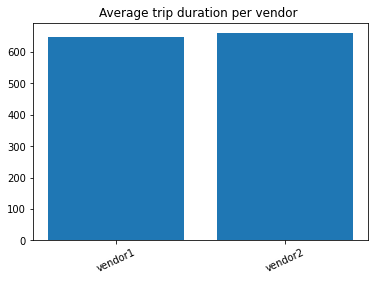

In [ ]:
# Average trip duration per vendor
total_duration=[0,0]
total_trips=[0,0]
for index in range(df.shape[0]):
  total_duration[df['vendor_id'].iloc[index]-1]=total_duration[df['vendor_id'].iloc[index]-1]+df["trip_duration"].iloc[index]
  trips_count[df['vendor_id'].iloc[index]-1]=trips_count[df['vendor_id'].iloc[index]-1]+1
values=[]
for i in range(0,2):
  if(trips_count[i]>0):
    values.append(total_duration[i]/trips_count[i])
  else:
    values.append(0)
ticks=["vendor1","vendor2"]
plt.bar(ticks,values)
plt.xticks(ticks,rotation= 25)
plt.title('Average trip duration per vendor ')
plt.show

# 6) Μέσος χρόνος ανα αριθμό επιβατών

<function matplotlib.pyplot.show>

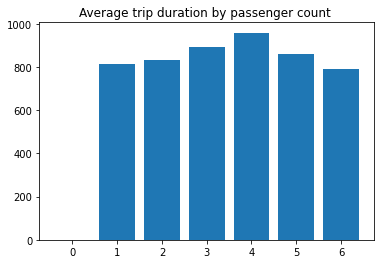

In [ ]:
# Average trip duration by passenger count
len=df["passenger_count"].max()
total_duration=[0]*(len+1)
trips_count=[0]*(len+1)
for index in range(df.shape[0]):
  total_duration[df['passenger_count'].iloc[index]]=total_duration[df['passenger_count'].iloc[index]]+df["trip_duration"].iloc[index]
  trips_count[df['passenger_count'].iloc[index]]=trips_count[df['passenger_count'].iloc[index]]+1
ticks=list(range(0,len+1))
values=[]
for i in range(0,len+1):
  if(trips_count[i]>0):
    values.append(total_duration[i]/trips_count[i])
  else:
    values.append(0)
plt.bar(ticks,values)
plt.xticks(ticks)
plt.title('Average trip duration by passenger count ')
plt.show

# 7) Υπολογισμός και προσθήκη του Manhattan distance στα dataframes

In [ ]:
# Manhattan distance for train df
min_distance=[]

for index in range(df.shape[0]):
  min_distance.append(manhattan_distances([[df["pickup_longitude"].iloc[index],df["dropoff_longitude"].iloc[index]]],[[df["pickup_latitude"].iloc[index],df["dropoff_latitude"].iloc[index]]])[0][0])
df["min_distance"]=min_distance

Εδώ "φτιάχνουμε" και τα δεδομένα του test dataframe για να μπορέσει να περάσει στους αλγορίθμους.

In [ ]:
newcolumn_set = {'pickup_day_name','pickup_day_period','pickup_season','vendor_id','pickup_month','passenger_count','pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude','pickup_hour','min_distance'}

# fix test df to have same attributes as train
df_test["pickup_datetime"]=pd.to_datetime(df_test["pickup_datetime"],infer_datetime_format=True)
df_test["pickup_day_period"]=pd.DatetimeIndex(df_test["pickup_datetime"]).hour 

df_test["pickup_day_name"] = df_test["pickup_datetime"].dt.day_name()
df_test['pickup_day_name'].replace({'Monday':1 ,'Tuesday':2 , 'Wednesday':3 , 'Thursday':4 , 'Friday':5 , 'Saturday':6 , 'Sunday':7},inplace = True)

df_test["pickup_month"] = pd.DatetimeIndex(df_test["pickup_datetime"]).month
df_test["pickup_hour"] = pd.DatetimeIndex(df_test["pickup_datetime"]).hour

df_test["pickup_season"] = pd.DatetimeIndex(df_test["pickup_datetime"]).month 


df_test["pickup_day_period"] = df_test["pickup_day_period"].map(vals_to_replace)

# petame tis stiles pou den xreiazomaste

df_test.drop(columns=[col for col in df_test if col not in newcolumn_set],axis = 1 , inplace=True)





Αντίστοιχα θα προσθέσουμε και το manhattan distance για το test df.
Τα γράφουμε σε νέο csv για να τα έχουμε έτοιμα για testing 

In [ ]:
# Manhattan distance for test df
min_distance=[]
for index in range(df_test.shape[0]):
  min_distance.append(manhattan_distances([[df_test["pickup_longitude"].iloc[index],df_test["dropoff_longitude"].iloc[index]]],[[df_test["pickup_latitude"].iloc[index],df_test["dropoff_latitude"].iloc[index]]])[0][0])
df_test["min_distance"]=min_distance

# grafoume se nep csv gia na apofygoume na kanoume pali cleaning wses fores tha kanoume test
df_test.to_csv('newtest.csv')

# 4) Ιστογράμματα σε 100 bins.

(array([1.54525611e-04, 6.23559655e-04, 9.63607832e-04, 1.04240995e-03,
        9.64375605e-04, 8.53289387e-04, 7.21789439e-04, 6.10244063e-04,
        4.95409306e-04, 4.07213262e-04, 3.32400555e-04, 2.64475224e-04,
        2.18295935e-04, 1.75646897e-04, 1.39591673e-04, 1.13841168e-04,
        9.30736609e-05, 7.47901249e-05, 6.16476573e-05, 4.96568492e-05,
        4.20468637e-05, 3.56638096e-05, 3.03947790e-05, 2.58483584e-05,
        2.20697108e-05, 1.90513090e-05, 1.65899190e-05, 1.37145338e-05,
        1.21940421e-05, 1.04251533e-05, 9.05520534e-06, 7.58740398e-06,
        7.09813685e-06, 5.68302579e-06, 4.71201874e-06, 4.41845847e-06,
        3.89155541e-06, 3.22163581e-06, 3.06356490e-06, 2.60440652e-06,
        2.13772096e-06, 1.77641601e-06, 1.55812760e-06, 1.40758387e-06,
        1.07638767e-06, 1.06886048e-06, 8.58099259e-07, 7.45191462e-07,
        6.39810851e-07, 4.89267121e-07, 4.44104003e-07, 3.01087459e-07,
        3.46250578e-07, 1.58070916e-07, 2.25815594e-07, 2.408699

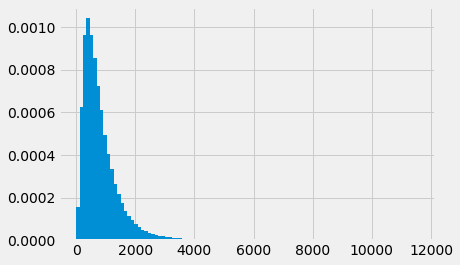

In [ ]:
# Trip duration histogram

plt.hist(df["trip_duration"],density=True,bins=100)

a) log tranformation για τους χρόνους

In [ ]:
# Log transormation
df["log_trip_duration"]=np.log2(df["trip_duration"])
df_target = pd.read_csv('smalltarget.csv')

# same for target
df_target["log_trip_duration"]=np.log2(df_target["trip_duration"])

# df.to_csv("with_log.csv")
df_target.to_csv("target_with_log.csv")

b) σχεδιασμός ιστογράμματος

(array([1.80444721e-04, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 8.18445697e-04,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.43711331e-03,
        0.00000000e+00, 0.00000000e+00, 1.48222449e-03, 0.00000000e+00,
        0.00000000e+00, 1.37911322e-03, 0.00000000e+00, 9.21556966e-04,
        1.05044605e-03, 0.00000000e+00, 9.79557055e-04, 1.15355732e-03,
        8.82890240e-04, 8.18445697e-04, 7.15334428e-04, 7.92667880e-04,
        1.55311349e-03, 5.86445342e-04, 1.28889086e-03, 6.63778794e-04,
        1.16000178e-03, 1.77222493e-03, 1.19866850e-03, 1.66266921e-03,
        1.27600195e-03, 1.59822467e-03, 2.23622564e-03, 2.31355910e-03,
        2.42955927e-03, 2.77755981e-03, 3.18356043e-03, 4.87845191e-03,
        5.40689716e-03, 6.39934313e-03, 9.76979273e-03, 1.17353513e-02,
        1.39586880e-02, 2.02098087e-02, 2.66091518e-02, 3.05982691e-02,
        4.19147308e-02, 5.31925259e-02, 6.53789889e-02, 8.371990

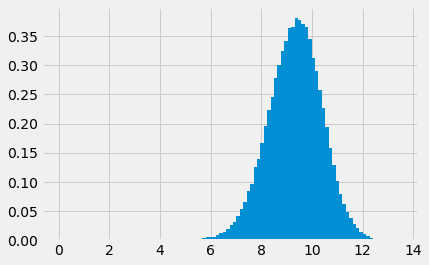

In [ ]:
# Log Trip duration histogram
plt.hist(df["log_trip_duration"],density=True,bins=100)

Συνέχεια του ερωτήματος (7) με μέσες αποστάσεις.

<function matplotlib.pyplot.show>

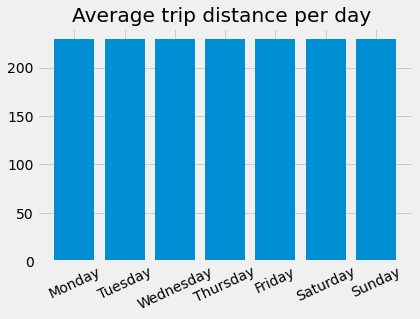

In [ ]:
# Average trip distance per day
trips_count=[0]*7
total_distance=[0]*7

for index in range(df.shape[0]):
  trueIndex=0
  if df['pickup_day_name'].iloc[index]=='Monday':
    trueIndex=0
  elif df['pickup_day_name'].iloc[index]=='Tuesday':
    trueIndex=1
  elif df['pickup_day_name'].iloc[index]=='Wednesday':
    trueIndex=2
  elif df['pickup_day_name'].iloc[index]=='Thursday':
    trueIndex=3
  elif df['pickup_day_name'].iloc[index]=='Friday':
    trueIndex=4
  elif df['pickup_day_name'].iloc[index]=='Saturday':
    trueIndex=5
  elif df['pickup_day_name'].iloc[index]=='Sunday':
    trueIndex=6
  total_distance[trueIndex]=total_distance[trueIndex]+df["min_distance"].iloc[index]
  trips_count[trueIndex]=trips_count[trueIndex]+1

ticks = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
values=[]
for i in range(0,7):
  if(trips_count[i]>0):
    values.append(total_distance[i]/trips_count[i])
  else:
    values.append(0)

plt.bar(ticks,values)
plt.xticks(ticks,rotation= 25)
plt.title('Average trip distance per day ')
plt.show

<function matplotlib.pyplot.show>

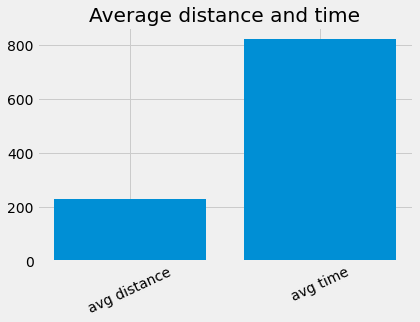

In [ ]:
#Average distance and time 
total_time=0
total_distance=0

for distance in df["min_distance"]:
  total_distance=total_distance+distance
for time in df["trip_duration"]:
  total_time=total_time+time

plt.bar(["avg distance","avg time"],[total_distance/df.shape[0],total_time/df.shape[0]])
plt.xticks(["avg distance","avg time"],rotation= 25)
plt.title('Average distance and time')
plt.show

# 8) Μέση ταχύτητα ανα ημέρα , περιόδους ημέρας και μήνα 

<function matplotlib.pyplot.show>

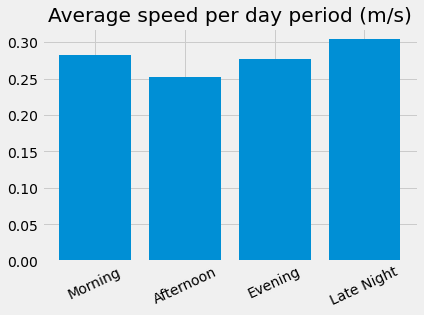

In [ ]:
# Average speed by time period
total_time=[0]*4
total_distance=[0]*4

for index in range(df.shape[0]):
  trueIndex=0
  if df['pickup_day_period'].iloc[index]== 1:
    trueIndex=0
  elif df['pickup_day_period'].iloc[index]== 2:
    trueIndex=1
  elif df['pickup_day_period'].iloc[index]== 3:
    trueIndex=2
  elif df['pickup_day_period'].iloc[index]== 4:
    trueIndex=3
  
  total_distance[trueIndex]=total_distance[trueIndex]+df["min_distance"].iloc[index]
  total_time[trueIndex]=total_time[trueIndex]+df["trip_duration"].iloc[index]

ticks = ['Morning','Afternoon','Evening','Late Night']
values=[]
for i in range(0,4):
  if(total_time[i]>0):
    values.append(total_distance[i]/total_time[i])
  else:
    values.append(0)

plt.bar(ticks,values)
plt.xticks(ticks,rotation= 25)
plt.title('Average speed per day period (m/s)')
plt.show

<function matplotlib.pyplot.show>

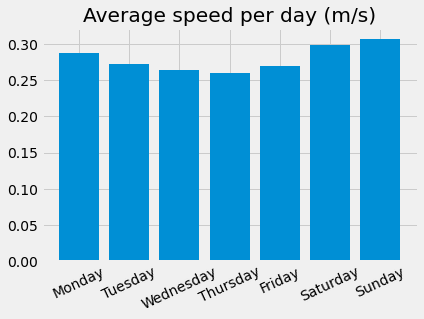

In [ ]:
# Average speed by day
total_time=[0]*7
total_distance=[0]*7

for index in range(df.shape[0]):
  trueIndex=0
  if df['pickup_day_name'].iloc[index]=='Monday':
    trueIndex=0
  elif df['pickup_day_name'].iloc[index]=='Tuesday':
    trueIndex=1
  elif df['pickup_day_name'].iloc[index]=='Wednesday':
    trueIndex=2
  elif df['pickup_day_name'].iloc[index]=='Thursday':
    trueIndex=3
  elif df['pickup_day_name'].iloc[index]=='Friday':
    trueIndex=4
  elif df['pickup_day_name'].iloc[index]=='Saturday':
    trueIndex=5
  elif df['pickup_day_name'].iloc[index]=='Sunday':
    trueIndex=6
  total_distance[trueIndex]=total_distance[trueIndex]+df["min_distance"].iloc[index]
  total_time[trueIndex]=total_time[trueIndex]+df["trip_duration"].iloc[index]

ticks = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
values=[]
for i in range(0,7):
  if(total_time[i]>0):
    values.append(total_distance[i]/total_time[i])
  else:
    values.append(0)

plt.bar(ticks,values)
plt.xticks(ticks,rotation= 25)
plt.title('Average speed per day (m/s)')
plt.show

<function matplotlib.pyplot.show>

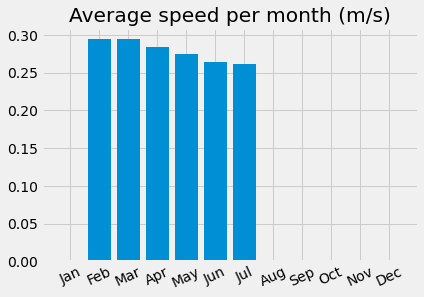

In [ ]:
# Average speed by month
total_time=[0]*12
total_distance=[0]*12
for index,month in enumerate(df["pickup_month"]):
  total_distance[month]=total_distance[month]+df["min_distance"].iloc[index]
  total_time[month]=total_time[month]+df["trip_duration"].iloc[index]
ticks = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov',"Dec"]
values=[]
for i in range(0,12):
  if(total_time[i]>0):
    values.append(total_distance[i]/total_time[i])
  else:
    values.append(0)

plt.bar(ticks,values)
plt.xticks(ticks,rotation= 25)
plt.title('Average speed per month (m/s)')
plt.show

Γενικά βγάζουμε κάποια αναμενόμενα αποτελέσματα:
Ο χρόνος ταξιδιού όπως και η ταχύτητα αυξάνεται τις εργάσιμες ημέρες, τους μήνες του χειμώνα και άνοιξης και κυρίως τις πρωινές και απογευματινές ώρες,
ενώ αρχίζει να μειώνεται προς τους καλοκαιρινούς μήνες, τις βραδινές ώρες (όπου ο κόσμος δεν δουλεύει) όπως επίσης και τα ΣΚ.  

Βλέπουμε επίσης πως η απόσταση των ταξιδιών δεν επηρεάζεται τόσο πολύ, το οποίο είναι και λογικό αφού κοιτάμε μόνο μέσα στα πλαίσια της ΝΥ.
Αυτό έχει και ως αποτέλεσμα η ταχύτητα να εμφανίζει αντίθετη συμπεριφορά με τον χρόνο ταξιδιού (μειώνεται τις κρίσιμες μέρες ώρες, αυξάνεται τις υπόλοιπες).

# 9) Scatter plots για pickup και dropoff σημεία

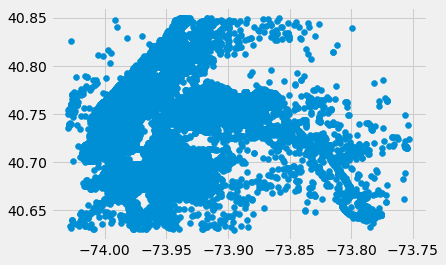

In [ ]:
# Scatter plots for lat long
longitude_array=df[['pickup_longitude']].to_numpy()
latitude_array=df[['pickup_latitude']].to_numpy()
plt.scatter(longitude_array,latitude_array)
plt.show()

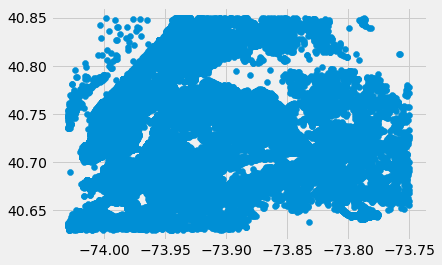

In [ ]:
# Scatter plots for lat long
longitude_array=df[['dropoff_longitude']].to_numpy()
latitude_array=df[['dropoff_latitude']].to_numpy()
plt.scatter(longitude_array,latitude_array)
plt.show()

# Συσταδοποίηση και πρόβλεψη διάρκειας ταξιδιού

**1) CLUSTERING**

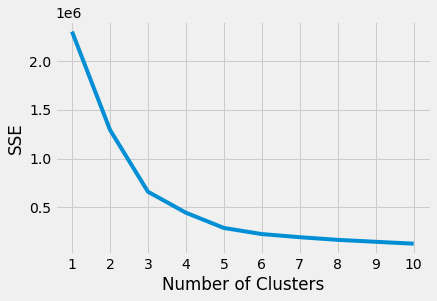

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# kanoume scale ta lat/long wste na paroume kalutera apotelesmata ston Kmeans
scaler = StandardScaler()

# prwta longitude meta lat gia na vgei swstos o xartis tis NY
scaled_features = scaler.fit_transform(df[['pickup_longitude','pickup_latitude']])

# tha kanoume dokimes gia 1 ws 10 clusters
sse = []
for k in range(1, 11):
  kmeans = KMeans(n_clusters=k)
  kmeans.fit(scaled_features)
  sse.append(kmeans.inertia_)

# Plot the data
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

# me ton kanona elbow ta apotelesmata tha mporousame na paroume apo 3 ews 5 
# tha paroume to 5 giati fainetai na exei symantiki diafora apo to 3




/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


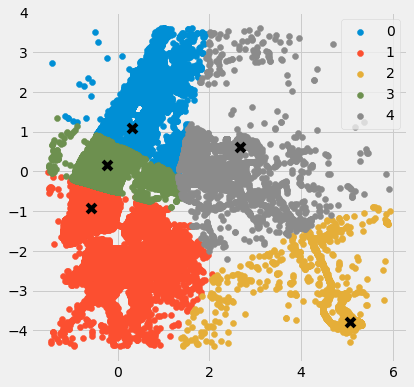

In [ ]:
# trexoume ton Kmeans me 5 clusters kai centroids
kmeans = KMeans(n_clusters = 5)

labels = kmeans.fit_predict(scaled_features)
centroids = kmeans.cluster_centers_

 
u_labels = np.unique(labels)
plt.figure(figsize=(6, 6))
 
#plotting the results:
 
for i in u_labels:
    plt.scatter(scaled_features[labels == i , 0] , scaled_features[labels == i , 1] , label = i)
plt.legend()

plt.scatter(centroids[:,0], centroids[:,1], marker="x",s = 80, color='black')
plt.show()


Με (x) φαίνονται τα centroids ενώ με κύκλο τα pickup points

**2) CLASSIFICATION**

In [ ]:
# allazoume ta dedomena kai gia to train se arithmous wste na mporesoume na ta perasoume apo RFR
df['pickup_day_name'].replace({'Monday':1 ,'Tuesday':2 , 'Wednesday':3 , 'Thursday':4 , 'Friday':5 , 'Saturday':6 , 'Sunday':7},inplace = True)


column_set = {'pickup_day_name','pickup_day_period','pickup_season','vendor_id','pickup_month','passenger_count','pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude','pickup_hour','min_distance','log_trip_duration'}
df.drop(columns=[col for col in df if col not in column_set], inplace=True)

# grafoume se neo csv για γρήγορο testing
df.to_csv('newtrain.csv')



Τρέχουμε τον RandomForestRegressor με μικρές παραμέτρους και βρίσκουμε τα Important Features

1.1163169566236089
0.7858055591801032
[0.         0.         0.         0.         0.02020071 0.01488285
 0.         0.         0.         0.05524606 0.         0.90967038]


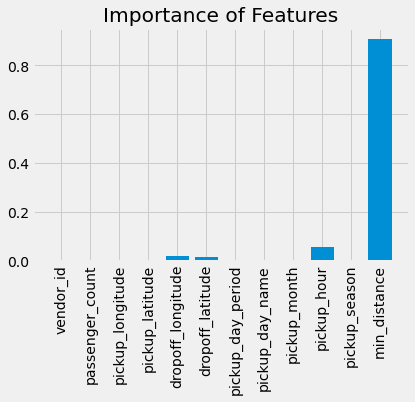

In [ ]:
from sklearn import ensemble
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score

new_train_df = pd.read_csv('newtrain.csv')
new_test_df = pd.read_csv('newtest.csv')

# otan grafoume se csv krataei kai tin arithmisi twn grammwn san column, opote petame to extra column
new_train_df = new_train_df.iloc[: , 1:]
new_test_df =  new_test_df.iloc[: , 1:]

clf = ensemble.RandomForestRegressor(max_depth = 3 , n_estimators = 10)

to_train = new_train_df.loc[:, new_train_df.columns != 'log_trip_duration']



clf.fit(to_train,new_train_df['log_trip_duration'])

prediction = clf.predict(new_test_df)

# apotelesmata tou RFR me default features
MSE_default_features = mean_squared_error(df_target['log_trip_duration'],prediction)
MAE_default_features = mean_absolute_error(df_target['log_trip_duration'],prediction)
print(MSE_default_features)
print(MAE_default_features)

important_features = clf.feature_importances_

print(important_features)

ticks = ['vendor_id','passenger_count','pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude','pickup_day_period','pickup_day_name','pickup_month','pickup_hour','pickup_season','min_distance']
plt.bar(ticks,important_features)
plt.xticks(ticks,rotation= 90)
plt.title('Importance of Features')
plt.show()

# vlepoume oti poly sumantiko rolo paizei h apostasi 
# 





Δεν χρειάζεται να τρέξει το επόμενο κομμάτι κώδικα αφού θα χαλάσει το dataset

In [ ]:
#################### DO NOT RUN ######################################

# edw kaname kapoies dokimes prin vgaloume apotelesmata me ton GridSearch empeirika me dedomena pou emeis pisteuame pws mporei na exoun shmasia 

new_train_df.drop(columns=['vendor_id', 'passenger_count' ,'pickup_day_period','pickup_day_name','pickup_month','pickup_season'], inplace =True)
new_test_df.drop(columns=['vendor_id', 'passenger_count' ,'pickup_day_period','pickup_day_name','pickup_month','pickup_season'], inplace =True)


clf = ensemble.RandomForestRegressor(max_depth= 10)

to_train = new_train_df.loc[:, new_train_df.columns != 'log_trip_duration']



clf.fit(to_train,new_train_df['log_trip_duration'])

prediction = clf.predict(new_test_df)

MSE_important_features = mean_squared_error(df_target['log_trip_duration'],prediction)
MAE_important_features = mean_absolute_error(df_target['log_trip_duration'],prediction)
print(MSE_important_features)
print(MAE_important_features)




# 3) GridSearchCV

Εδώ δοκιμάσαμε αρκετές φορές με διαφορετικές παραμέτρους "πειράζοντας" το search_space

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from sklearn.ensemble import RandomForestRegressor

# dokimes me diafores parametrous mesw tou Grid Search
# oi sugkekrimenes parametroi se olokliro to dataset tha argisoun polu
search_space = {
    "max_depth": [10,50,100,None],
    "n_estimators" : [50,100,200,500],
    "max_features" : [1,3,8,"auto"]
}


# pernoume apotelesmata sxetika me ta MSE,MAE
GS = GridSearchCV(
    estimator = clf,
    param_grid = search_space,
    scoring = ["neg_mean_squared_error" , "neg_mean_absolute_error"],
    refit = "neg_mean_squared_error",
    cv = 5,
    verbose = 4
)

Tρέχουμε τον GridSearch για να βρούμε βέλτιστες παραμέτρους
Δυστυχώς για το fit σε αυτό το σημείο με ολόκληρο dataset έβγαζε runtime error
οπότε βλέπετε τις δοκιμές με λιγότερα rows.

In [ ]:
GS.fit(to_train,new_train_df['log_trip_duration'])

Fitting 5 folds for each of 64 candidates, totalling 320 fits
[CV 1/5] END max_depth=10, max_features=1, n_estimators=50; neg_mean_absolute_error: (test=-0.706) neg_mean_squared_error: (test=-0.823) total time=   0.1s
[CV 2/5] END max_depth=10, max_features=1, n_estimators=50; neg_mean_absolute_error: (test=-0.756) neg_mean_squared_error: (test=-1.078) total time=   0.1s
[CV 3/5] END max_depth=10, max_features=1, n_estimators=50; neg_mean_absolute_error: (test=-0.689) neg_mean_squared_error: (test=-0.752) total time=   0.1s
[CV 4/5] END max_depth=10, max_features=1, n_estimators=50; neg_mean_absolute_error: (test=-0.777) neg_mean_squared_error: (test=-1.172) total time=   0.1s
[CV 5/5] END max_depth=10, max_features=1, n_estimators=50; neg_mean_absolute_error: (test=-0.736) neg_mean_squared_error: (test=-0.897) total time=   0.1s
[CV 1/5] END max_depth=10, max_features=1, n_estimators=100; neg_mean_absolute_error: (test=-0.689) neg_mean_squared_error: (test=-0.790) total time=   0.2s
[

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [10, 50, 100, None],
                         'max_features': [1, 3, 8, 'auto'],
                         'n_estimators': [50, 100, 200, 500]},
             refit='neg_mean_squared_error',
             scoring=['neg_mean_squared_error', 'neg_mean_absolute_error'],
             verbose=4)

Μια εκτύπωση των καλύτερων παραμέτρων και γράφουμε σε csv τα αποτελέσματα για καλύτερη ανάλυση

In [ ]:
import pandas as pd
results_df = pd.DataFrame(GS.cv_results_)
results_df = results_df.sort_values("rank_test_neg_mean_squared_error")
results_df.to_csv("results.csv")

# tha paroume gia tin askisi tis kaluteres parametrous pou exoume ws apotelesma
params = results_df['params'][0]


In [ ]:
print(GS.best_estimator_)
print(GS.best_params_)
print(GS.best_score_)

# 4) Δοκιμή με τις νέες παραμέτρους

In [ ]:
# clf = ensemble.RandomForestRegressor(max_depth = params['max_depth'] , max_features = params['max_features'], n_estimators= params['n_estimators'])
clf = ensemble.RandomForestRegressor(max_depth = 100 , max_features = 8, n_estimators= 100)


to_train = new_train_df.loc[:, new_train_df.columns != 'log_trip_duration']



clf.fit(to_train,new_train_df['log_trip_duration'])

prediction = clf.predict(new_test_df)

MSE_all_features = mean_squared_error(df_target['log_trip_duration'],prediction)
MAE_all_features = mean_absolute_error(df_target['log_trip_duration'],prediction)
print(MSE_all_features)
print(MAE_all_features)

0.4375287351173503
0.4143288352391606


# 5) Συγκρίνουμε εδώ τα αποτελέσματα χρησιμοποιώντας τις μετρικές ΜΑΕ και MSE

<function matplotlib.pyplot.show>

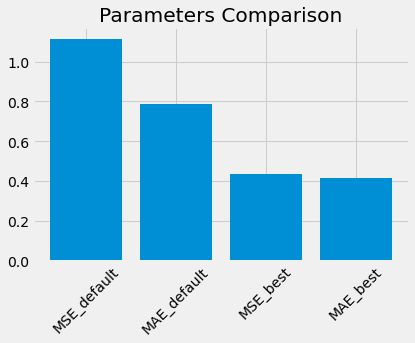

In [ ]:
ticks = ['MSE_default','MAE_default','MSE_best','MAE_best']
values = [MSE_default_features, MAE_default_features, MSE_all_features,MAE_all_features]

plt.bar(ticks,values)
plt.xticks(ticks,rotation= 45)
plt.title('Parameters Comparison')
plt.show


# Συμπεράσματα





Ας δούμε κάποια αποτελέσματα που είχαμε για 100.000 rows στο train dataset και 20.000 στο test/target.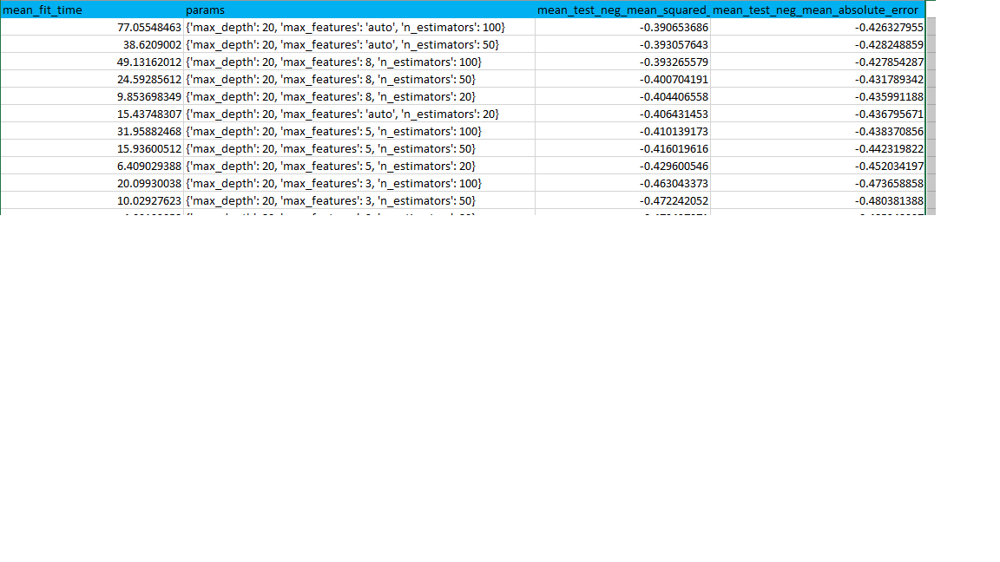

Έχουμε τις καλύτερες παραμέτρους να είναι max_depth = 20, max_features = auto (όλες) ,n_estimators = 100

Παρόλα αυτά βλέπουμε ότι χρησιμοποιώντας 50 δεντρα (estimators) μειώνουμε το χρόνο στο μισό και πέρνουμε score ελάχιστα χειρότερο από τα 100.

Ανάλογα λοιπόν με το μέγεθος του dataset  , το πόσο σημαντικό είναι να έχουμε το καλύτερο δυνατό αποτέλεσμα και πόσο "κοστίζει" ο χρόνος μπορούμε να επιλέξουμε διαφορετικές παραμέτρους.
Γενικότερα όμως παρατηρήσαμε πως μειώνοντας δραματικά τον αριθμό features αποτυγχάνει περισσότερο ο αλγόριθμος να κάνει σωστό prediction.

# Folium Map



> sdi0800018 Μιχάλης Δεικτάκης



> sdi1800216 Ιωάννης Ψαρρός



In [ ]:
import folium
import pandas as pd

map = folium.Map(location = [40.730610,-73.935242], zoom_start= 6)

for index,row in enumerate(df['pickup_longitude']):
  folium.Circle(
    radius=4,
    location=[new_train_df['pickup_latitude'][index],new_train_df['pickup_longitude'][index]],
    color="blue",
    fill=True,
  ).add_to(map)
  folium.Circle(
    radius=4,
    location=[new_train_df['dropoff_latitude'][index],new_train_df['dropoff_longitude'][index]],
    color="red",
    fill=True,
  ).add_to(map)
  
map
# map.save('ny.html')